## Data Subsampling

In [1]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, substring
import os
import glob
from pyspark.sql import SparkSession
from pyspark.sql.functions import col
from pyspark.sql.types import DoubleType
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
from datetime import datetime
from functools import reduce
import geodatasets
import glob
import os

# Initialize Spark with proper configuration
spark = SparkSession.builder \
    .appName("Tornado Analysis") \
    .master("local[*]") \
    .config("spark.driver.memory", "4g") \
    .config("spark.sql.shuffle.partitions", "4") \
    .getOrCreate()

# Set log level to reduce noise
spark.sparkContext.setLogLevel("ERROR")

# Path to your directories
base_path = "/home/alumno/reposirotio/Grupo3"
current_year = datetime.now().year
min_year = current_year - 1

Using Spark's default log4j profile: org/apache/spark/log4j2-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/12/29 11:16:16 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [2]:
dfs = []
year_dirs = sorted(glob.glob(f"{base_path}/*.tar"))
print(f"Found {len(year_dirs)} year archives")

for year_dir in year_dirs:
    year = os.path.basename(year_dir).replace(".tar", "")

    if not year.isdigit():
        continue

    if int(year) < min_year:
        continue

    print(f"Processing year {year}...")

    csv_path = os.path.join(year_dir, "*.csv")

    try:
        df = (
            spark.read
            .option("header", "true")
            .option("quote", '"')
            .option("escape", '"')
            .option("ignoreLeadingWhiteSpace", "true")
            .option("ignoreTrailingWhiteSpace", "true")
            .csv(csv_path)
        )

        # normalize column names
        df = df.select([col(c).alias(c.strip()) for c in df.columns])

        clean_df = (
            df.select(
                col("STATION"),
                col("NAME"),
                col("LATITUDE").cast(DoubleType()),
                col("LONGITUDE").cast(DoubleType()),
                col("ELEVATION").cast(DoubleType())
            )
            .dropna(subset=["STATION", "LATITUDE", "LONGITUDE"])
        )

        count = clean_df.count()
        print(f"  Loaded {count:,} valid rows")

        if count > 0:
            dfs.append(clean_df)

    except Exception as e:
        print(f"  Error: {str(e)[:200]}")


if not dfs:
    raise RuntimeError("No valid data loaded")

all_data = reduce(lambda a, b: a.unionByName(b), dfs)

# Unique stations
stations_df = (
    all_data
    .select("STATION", "NAME", "LATITUDE", "LONGITUDE", "ELEVATION")
    .dropDuplicates(["STATION"])
)

total_stations = stations_df.count()
print(f"Total unique stations: {total_stations}")

Found 93 year archives
Processing year 2024...


  Loaded 3,919,438 valid rows
Processing year 2025...


  Loaded 2,520,060 valid rows


Total unique stations: 12218


## 10%

In [3]:
sampled_stations = stations_df.sample(
    fraction=0.10,
    seed=42
)

print(f"Sampled stations: {sampled_stations.count()}")

# Convert to pandas for plotting
stations_pd = sampled_stations.toPandas()

Sampled stations: 1304


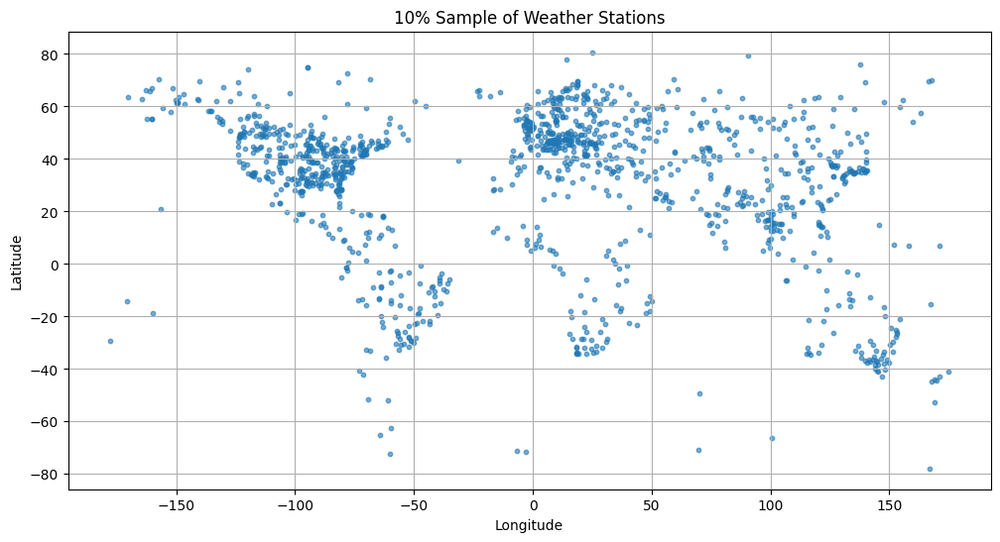

In [4]:
plt.figure(figsize=(12, 6))
plt.scatter(
    stations_pd["LONGITUDE"],
    stations_pd["LATITUDE"],
    s=10,
    alpha=0.6
)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("10% Sample of Weather Stations")
plt.grid(True)
plt.show()

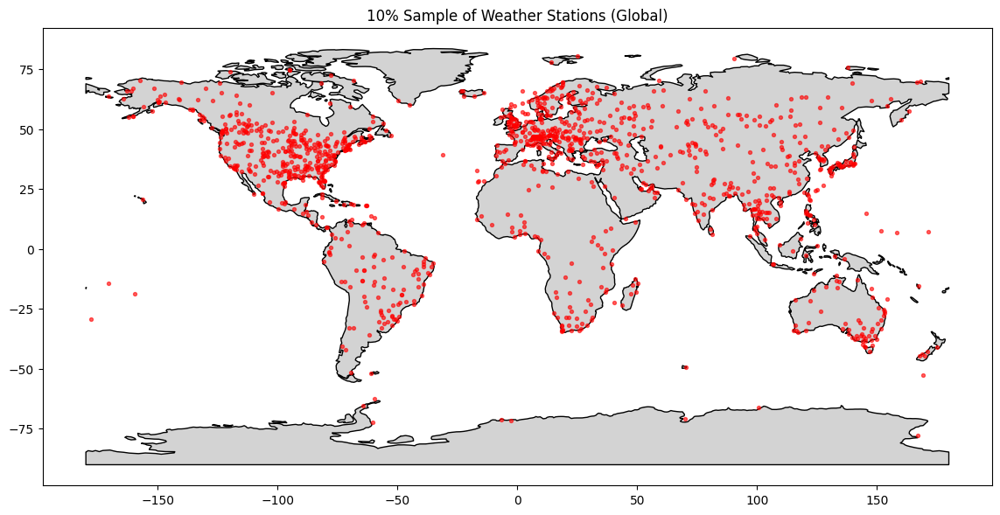

In [5]:
geometry = [
    Point(xy)
    for xy in zip(stations_pd["LONGITUDE"], stations_pd["LATITUDE"])
]

gdf = gpd.GeoDataFrame(stations_pd, geometry=geometry, crs="EPSG:4326")

world = gpd.read_file(geodatasets.get_path("naturalearth.land"))

fig, ax = plt.subplots(figsize=(14, 8))
world.plot(ax=ax, color="lightgray", edgecolor="black")
gdf.plot(ax=ax, color="red", markersize=8, alpha=0.6)

ax.set_title("10% Sample of Weather Stations (Global)")
plt.show()


## 100%

In [6]:
sampled_stations = stations_df.sample(
    fraction=1.0,
    seed=42
)

print(f"Sampled stations: {sampled_stations.count()}")

# Convert to pandas for plotting
stations_pd = sampled_stations.toPandas()

Sampled stations: 12218


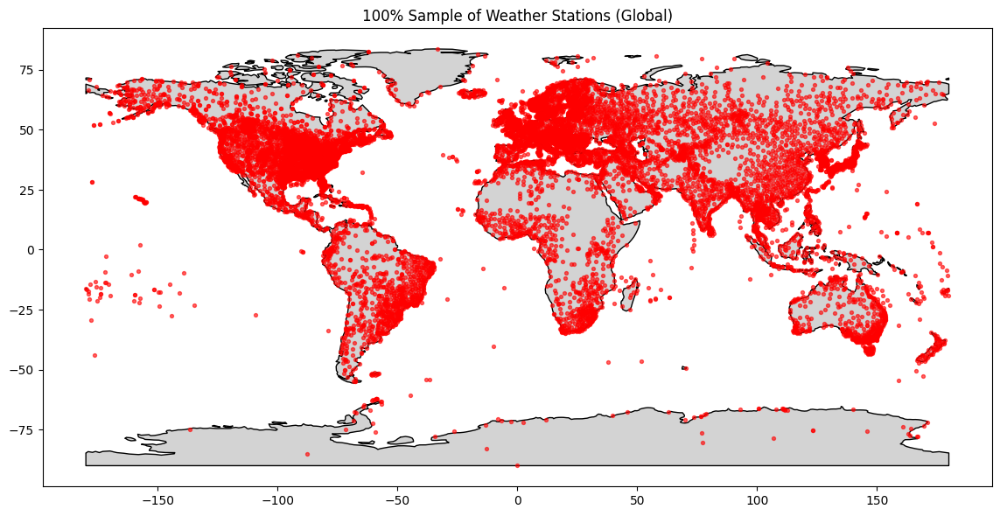

In [9]:
geometry = [
    Point(xy)
    for xy in zip(stations_pd["LONGITUDE"], stations_pd["LATITUDE"])
]

gdf = gpd.GeoDataFrame(stations_pd, geometry=geometry, crs="EPSG:4326")

world = gpd.read_file(geodatasets.get_path("naturalearth.land"))

fig, ax = plt.subplots(figsize=(14, 8))
world.plot(ax=ax, color="lightgray", edgecolor="black")
gdf.plot(ax=ax, color="red", markersize=8, alpha=0.6)

ax.set_title("100% Sample of Weather Stations (Global)")
plt.show()


## Interactive Map

In [8]:
import folium

# Center map roughly at global center
m = folium.Map(location=[20, 0], zoom_start=2, tiles="CartoDB positron")

# Optional: sample if too many points
sample = stations_pd.sample(frac=1, random_state=42)

for _, row in sample.iterrows():
    folium.CircleMarker(
        location=[row["LATITUDE"], row["LONGITUDE"]],
        radius=3,
        color="red",
        fill=True,
        fill_opacity=0.6,
        popup=f"Station: {row['NAME']}"
    ).add_to(m)

m


# Data Splits

In [1]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, year, month, cos, sin, pi, count, when
import time

num_cores = 4 
spark = SparkSession.builder \
    .appName("SnowDepthPrediction") \
    .master(f"local[{num_cores}]") \
    .config("spark.driver.memory", "8g") \
    .getOrCreate()

# 2. Loading Strategy: Read all years at once
# Spark can read a list of paths or a wildcard if the schema is the same
path_pattern = "/home/alumno/reposirotio/Grupo3/[2-9]*.tar" # Adjust to match 2010-2025
raw_df = spark.read.csv(path_pattern, header=True, inferSchema=True)

# 3. Filter Stations for Quality (Keep stations with > 80% data coverage)
def filter_quality_stations(df, threshold=0.8):
    # Group by station to count records
    station_stats = df.groupBy("STATION").agg(count("SNWD").alias("count_snwd"))
    max_possible_days = 15 * 365
    
    # Filter stations that have enough data
    quality_stations = station_stats.filter(col("count_snwd") > (max_possible_days * threshold))
    return df.join(quality_stations, "STATION", "inner")

df_filtered = filter_quality_stations(raw_df)

# 4. Feature Engineering: Time & Geometry
# Convert DATE to actual year/month and apply circular encoding for seasonality
df_featured = df_filtered.withColumn("year", year("DATE")) \
                         .withColumn("month", month("DATE")) \
                         .withColumn("month_sin", sin(2 * pi() * col("month") / 12)) \
                         .withColumn("month_cos", cos(2 * pi() * col("month") / 12))

# 5. Temporal Split (The "Professional" Approach)
# Using 2024+ for Testing as suggested by your current date
train_val_df = df_featured.filter(col("year") < 2023)
test_df = df_featured.filter(col("year") >= 2023)

# Further split train_val into Train (80%) and Validation (20%)
# Use a seed for reproducibility
train_df, val_df = train_val_df.randomSplit([0.8, 0.2], seed=42)

print(f"Train rows: {train_df.count()}, Test rows: {test_df.count()}")

Using Spark's default log4j profile: org/apache/spark/log4j2-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/12/31 12:07:41 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/12/31 12:07:46 WARN FileStreamSink: Assume no metadata directory. Error while looking for metadata directory in the path: /home/alumno/reposirotio/Grupo3/[2-9]*.tar.
java.io.FileNotFoundException: File /home/alumno/reposirotio/Grupo3/[2-9]*.tar does not exist
	at org.apache.hadoop.fs.RawLocalFileSystem.deprecatedGetFileStatus(RawLocalFileSystem.java:917)
	at org.apache.hadoop.fs.RawLocalFileSystem.getFileLinkStatusInternal(RawLocalFileSystem.java:1238)
	at org.apache.hadoop.fs.RawLocalFileSystem.getFileStatus(RawLocalFileSystem.java:907)
	at org.apache.hadoop.fs.FilterFileSystem.getFileStatus(FilterFileSystem.java:462)
	at org.apache.s

AnalysisException: [UNRESOLVED_COLUMN.WITH_SUGGESTION] A column, variable, or function parameter with name `STATION` cannot be resolved. Did you mean one of the following? [`DATE`, `ELEVATION`, `MAX`, `MIN`, `NAME`]. SQLSTATE: 42703;
'Aggregate ['STATION], ['STATION, 'count('SNWD) AS count_snwd#45]
+- Relation [01001099999.csv                                                                                     0100644 0000000 0000000 00000251235 14542276321 011516  0                                                                                                    ustar 00                                                                0000000 0000000                                                                                                                                                                        "STATION"#17,DATE#18,LATITUDE#19,LONGITUDE#20,ELEVATION#21,NAME#22,TEMP#23,TEMP_ATTRIBUTES#24,DEWP#25,DEWP_ATTRIBUTES#26,SLP#27,SLP_ATTRIBUTES#28,STP#29,STP_ATTRIBUTES#30,VISIB#31,VISIB_ATTRIBUTES#32,WDSP#33,WDSP_ATTRIBUTES#34,MXSPD#35,GUST#36,MAX#37,MAX_ATTRIBUTES#38,MIN#39,MIN_ATTRIBUTES#40,PRCP#41,... 3 more fields] csv


# Speed-Up